<a href="https://colab.research.google.com/github/ipeirotis/dealing_with_data/blob/master/06-Spatial_Data_and_Maps/F-Visualization_of_Population_Data_with_Choropleths.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visualizing Population and Unemployment Data

In [1]:
!apt-get update

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:2 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:4 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:5 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:6 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:8 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:9 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Ign:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [696 B]
Hit:13 https://developer.download.nvidia.com/

In [3]:
!apt-get install -y -qq libproj-dev proj-data proj-bin libgdal-dev libspatialindex-dev  libgeos-dev

In [4]:
!pip uninstall -y  shapely
!pip install shapely --no-binary shapely

Found existing installation: Shapely 1.7.1
Uninstalling Shapely-1.7.1:
  Successfully uninstalled Shapely-1.7.1
     |████████████████████████████████| 278 kB 15.7 MB/s 
Skipping wheel build for shapely, due to binaries being disabled for it.
    Running setup.py install for shapely ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [5]:
!pip install pyshp six cartopy geopandas fiona pyproj descartes pysal rtree pykdtree pyepsg pillow OWSLib geoplot

     |████████████████████████████████| 219 kB 15.4 MB/s 
     |████████████████████████████████| 10.8 MB 44.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 43.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 38.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.0 MB 22.5 MB/s 
     |████████████████████████████████| 15.4 MB 88 kB/s 
     |████████████████████████████████| 6.3 MB 37.1 MB/s 
     |████████████████████████████████| 994 kB 32.5 MB/s 
     |████████████████████████████████| 212 kB 41.4 MB/s 
     |████████████████████████████████| 216 kB 47.3 MB/s 
     |████████████████████████████████| 2.4 MB 41.3 MB/s 
     |████████████████████████████████| 95 kB 1.7 MB/s 


In [6]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import requests # to connect to the Census API

import pandas as pd
import numpy as np

import geopandas as gpd
import geoplot
import geoplot.crs as gcrs

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.6.2-CAPI-1.10.2 4d2925d6) is incompatible with the GEOS version PyGEOS was compiled with (3.10.0-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [7]:
# To plot the choropleths, we need the shapefiles for the areas. Below we use 
# shapefiles that come from the US Census data
# 
# More files at https://www.census.gov/geo/maps-data/data/tiger-cart-boundary.html
# 
# Check also http://geojson.xyz/ for more shapefiles
#
shapefiles_zipcodes = "http://www2.census.gov/geo/tiger/GENZ2017/shp/cb_2017_us_zcta510_500k.zip"
shapefiles_counties = "http://www2.census.gov/geo/tiger/GENZ2017/shp/cb_2017_us_county_500k.zip"
shapefiles_states   = "http://www2.census.gov/geo/tiger/GENZ2017/shp/cb_2017_us_state_500k.zip"

## Load GeoDataframe for US States and plot a map

In [9]:
df_states = gpd.read_file(shapefiles_states)

In [10]:
# df_states

In [11]:
# Dropping non-continental states
df_states = df_states[ df_states.NAME!='Alaska' ] 
df_states = df_states[ df_states.NAME!='Hawaii' ] 
df_states = df_states[ df_states.NAME!='Puerto Rico' ] 
df_states = df_states[ df_states.NAME!='Guam' ] 
df_states = df_states[ df_states.NAME!='Commonwealth of the Northern Mariana Islands' ] 
df_states = df_states[ df_states.NAME!='American Samoa' ] 
df_states = df_states[ df_states.NAME!='United States Virgin Islands' ] 

In [12]:
# Should be 49. The 48 continental, plus DC
assert( len(df_states) == 49 )

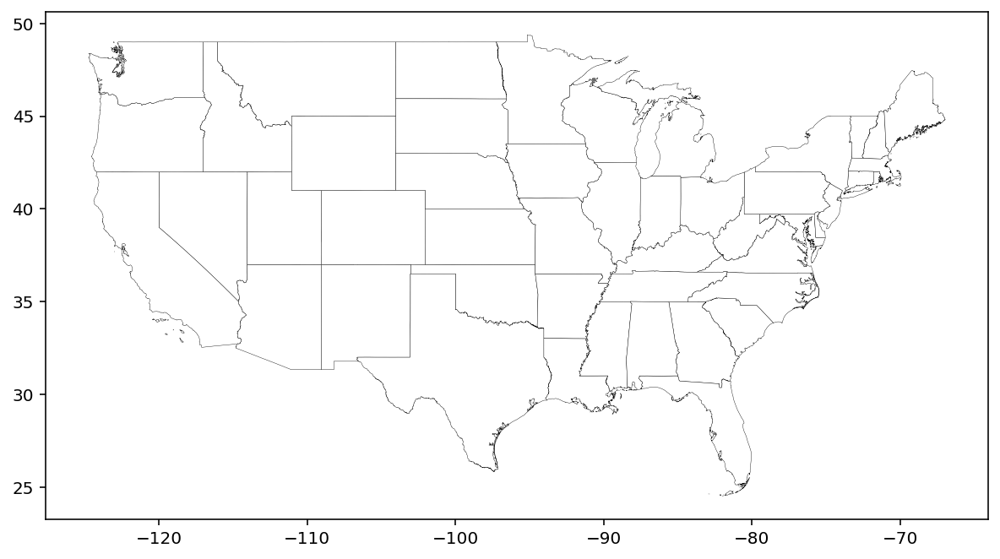

In [13]:
df_states.plot(
    figsize=(10,10), 
    linewidth=0.2, 
    color='white', 
    edgecolor='black'
)

## Load US Counties Datafame and plot a map

In [14]:
df_counties = gpd.read_file(shapefiles_counties)

In [15]:
# df_counties

In [16]:
len(df_counties)

3233

In [17]:
# There should be 3233 counties looaded
assert( len(df_counties) == 3233 )

In [18]:
# Keep only counties in the lower 48 states + DC
keep_county = df_counties.STATEFP.isin(df_states.STATEFP.values)
df_counties = df_counties[ keep_county ]

In [19]:
# There should be 3108 counties remaining
assert(len(df_counties) == 3108)

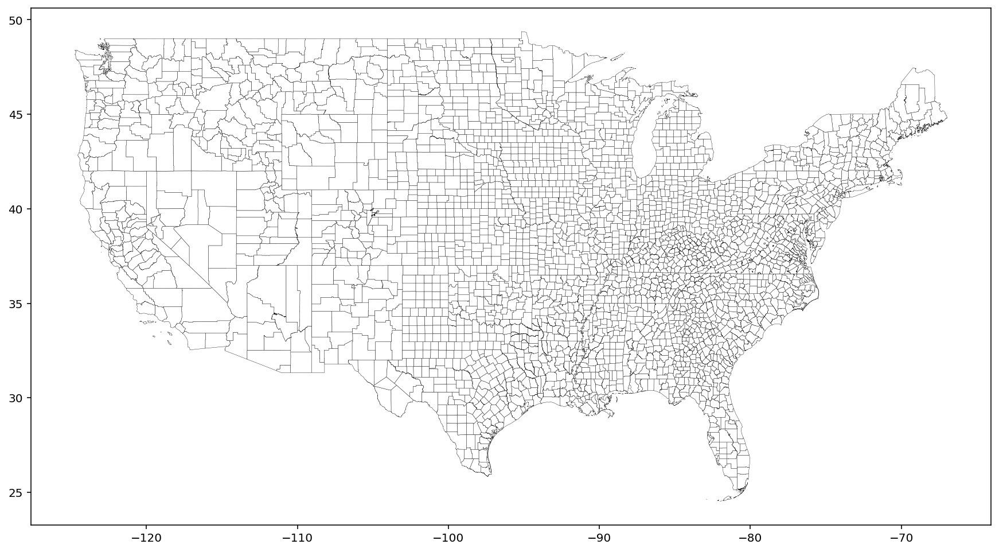

In [20]:
df_counties.plot(
    figsize=(15,15), 
    linewidth=0.2,  
    color='white', 
    edgecolor='black'
)

## Getting Census Data

You need to get an API Key from http://api.census.gov/data/key_signup.html.

In [21]:
# https://www.census.gov/data/developers/data-sets.html

# Querying the "Decentennial" (dec) censur of 2010
# https://www.census.gov/data/developers/data-sets/decennial-census.html

class Census:
    def __init__(self, key):
        self.key = key

    def get(self, fields, geo, dataset='sf1'):
        fields = [','.join(fields)]
        base_url = f'https://api.census.gov/data/2010/dec/{dataset}?key={self.key}&get='
        query = fields
        for item in geo:
            query.append(item)
        add_url = '&'.join(query)
        url = base_url + add_url
        response = requests.get(url)
        return response.json()
        # return ast.literal_eval(response.text) 

api_key = '627d4107b57d4576f2120d2b87b59c7440e5d2af'
census = Census(api_key)

## Plot a Choropleth with Population of US States

In [22]:
# We are querying for "Population" (variable P001001)
# See https://api.census.gov/data/2010/dec/sf1/variables.html for other variables

# Fetch state population data from US Census
census_response = census.get(['P001001'], ['for=state:*'])
census_response

[['P001001', 'state'],
 ['4779736', '01'],
 ['710231', '02'],
 ['6392017', '04'],
 ['2915918', '05'],
 ['37253956', '06'],
 ['4533372', '22'],
 ['4339367', '21'],
 ['5029196', '08'],
 ['3574097', '09'],
 ['897934', '10'],
 ['601723', '11'],
 ['18801310', '12'],
 ['9687653', '13'],
 ['1360301', '15'],
 ['1567582', '16'],
 ['12830632', '17'],
 ['6483802', '18'],
 ['3046355', '19'],
 ['2853118', '20'],
 ['1328361', '23'],
 ['5773552', '24'],
 ['6547629', '25'],
 ['9883640', '26'],
 ['5303925', '27'],
 ['2967297', '28'],
 ['5988927', '29'],
 ['989415', '30'],
 ['1826341', '31'],
 ['2700551', '32'],
 ['1316470', '33'],
 ['8791894', '34'],
 ['2059179', '35'],
 ['19378102', '36'],
 ['9535483', '37'],
 ['672591', '38'],
 ['11536504', '39'],
 ['3751351', '40'],
 ['3831074', '41'],
 ['12702379', '42'],
 ['1052567', '44'],
 ['4625364', '45'],
 ['814180', '46'],
 ['6346105', '47'],
 ['25145561', '48'],
 ['2763885', '49'],
 ['625741', '50'],
 ['8001024', '51'],
 ['6724540', '53'],
 ['1852994', '54'

In [23]:
# Manipulate the result from the US Census API and convert the result to a dataframe
df_state_population = pd.DataFrame(census_response[1:], columns = ['Population', 'STATEFP'])
df_state_population['Population'] = pd.to_numeric(df_state_population['Population'])
df_state_population['LogPopulation'] = np.log10(df_state_population['Population'])
df_state_population

,Population,STATEFP,LogPopulation
0,4779736,01,6.679404
1,710231,02,5.851400
2,6392017,04,6.805638
3,2915918,05,6.464775
4,37253956,06,7.571172
5,4533372,22,6.656421
6,4339367,21,6.637426
7,5029196,08,6.701499
8,3574097,09,6.553166
9,897934,10,5.953244


In [24]:
# ax = df_state_population.LogPopulation.hist()
# df_state_population.LogPopulation.plot.kde(secondary_y=True, ax = ax)

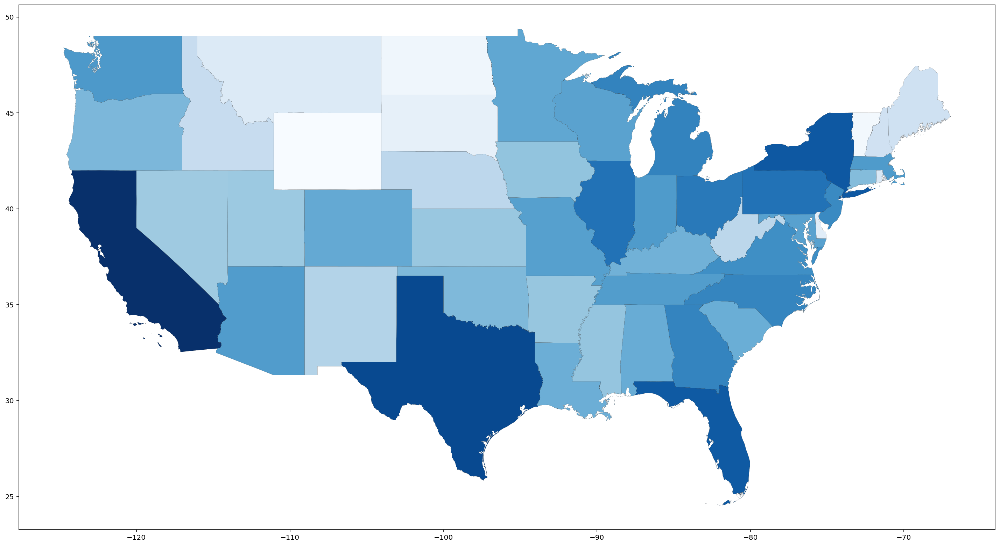

In [25]:
# Augment the df_states geodataframe with population information
states_choropleth = pd.merge(df_states, df_state_population, on='STATEFP')

states_choropleth.plot(
    figsize=(25,25), 
    column='LogPopulation', 
    cmap='Blues',  # select color scheme from http://matplotlib.org/users/colormaps.html
    linewidth=0.1, 
    edgecolor='black'
)

## Plot a Choropleth with Population of US Counties

In [26]:
# Query the US Census API for the population of each county
census_response = census.get(['P001001'], ['in=state:*', 'for=county:*'])
# Manipulate the API response and put the results in a dataframe
df_county_population = pd.DataFrame(census_response[1:], columns = ['Population', 'STATEFP', 'COUNTYFP'])
df_county_population['Population'] = pd.to_numeric(df_county_population['Population'])
df_county_population['LogPopulation'] = np.log10(df_county_population['Population'])
# df_county_population

In [27]:
df_county_population.head(5)

,Population,STATEFP,COUNTYFP,LogPopulation
0,125744,05,131,5.099487
1,17058,05,133,4.231928
2,17264,05,135,4.237141
3,12394,05,137,4.093211
4,41639,05,139,4.619500


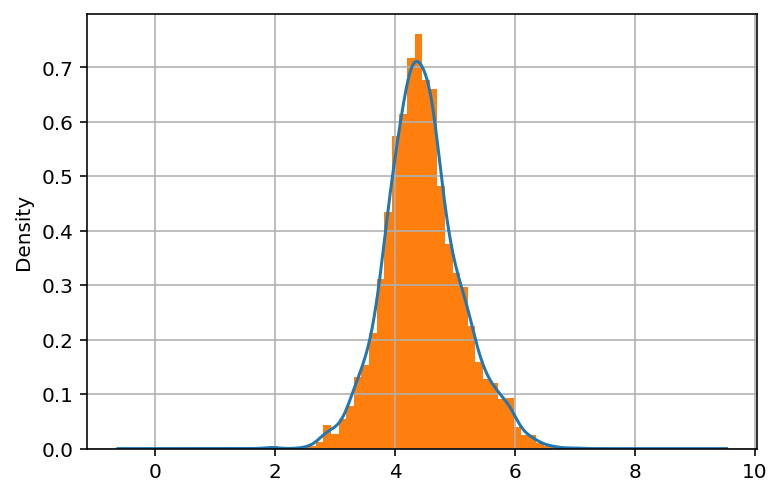

In [28]:
df_county_population.LogPopulation.plot.kde()
df_county_population.LogPopulation.hist(bins=40, density=True)

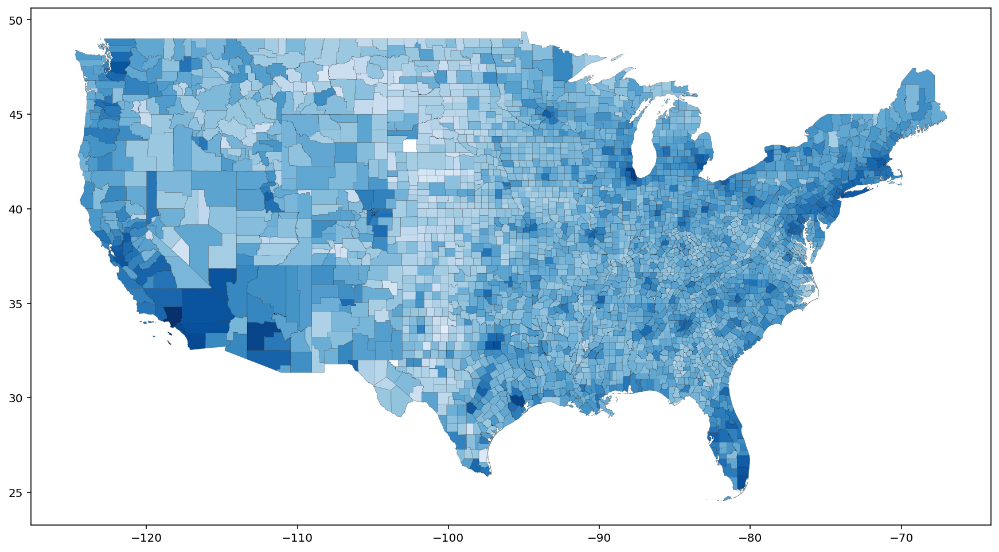

In [29]:
# Merge the GeoDataFrame df_counties with the population data
counties_choropleth = pd.merge(df_counties, df_county_population, on=['STATEFP', 'COUNTYFP'])

counties_choropleth.plot(
    figsize=(15,15), 
    column='LogPopulation', 
    cmap='Blues', # http://matplotlib.org/users/colormaps.html
    # scheme='Quantiles', # alternatives are 'Quantiles', Equal_Interval', and 'Fisher_Jenks'; Quantiles requires PySAL
    linewidth=0.1, 
    edgecolor='black')

## Extras

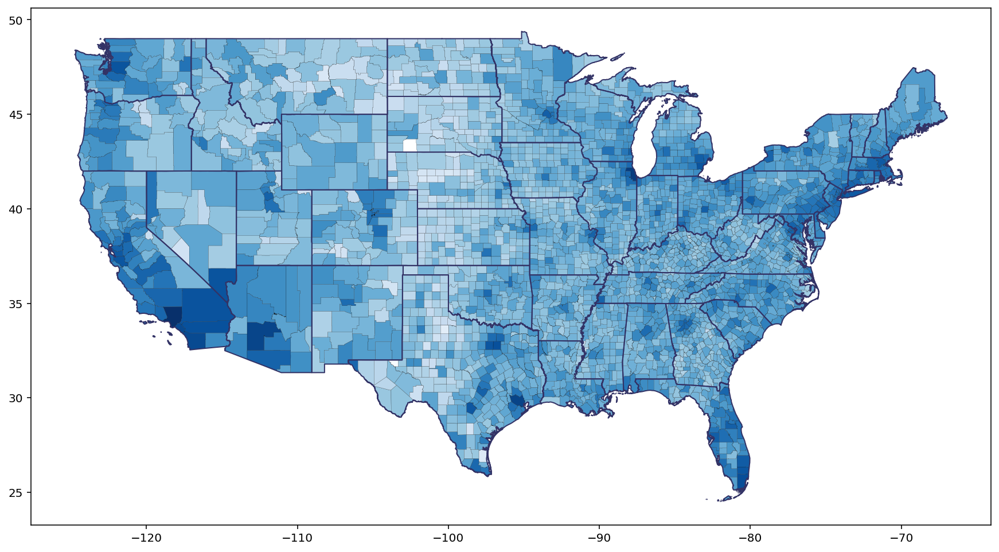

In [30]:
# Plot the state borders (with darker, thicker lines) on top of the counties

ax = counties_choropleth.plot(
    figsize=(15,15), 
    column='LogPopulation', 
    cmap='Blues', # http://matplotlib.org/users/colormaps.html
    # scheme='Quantiles', # alternatives are 'Quantiles', Equal_Interval', and 'Fisher_Jenks'; Quantiles requires PySAL
    linewidth=0.1, 
    edgecolor='black')

df_states.plot(
    figsize=(15,15), 
    linewidth=1, # thicker line
    facecolor='none', # no color for fill
    edgecolor='#333366', # color for the state borders
    ax = ax # plot it on top of the counties plot
)


In [31]:
# Check https://pysal.org/mapclassify/api.html for all the difference schemes
import mapclassify as mc
# scheme = mc.FisherJenks(counties_choropleth['LogPopulation'], k=10)
scheme = mc.Quantiles(counties_choropleth['LogPopulation'],k=100)

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


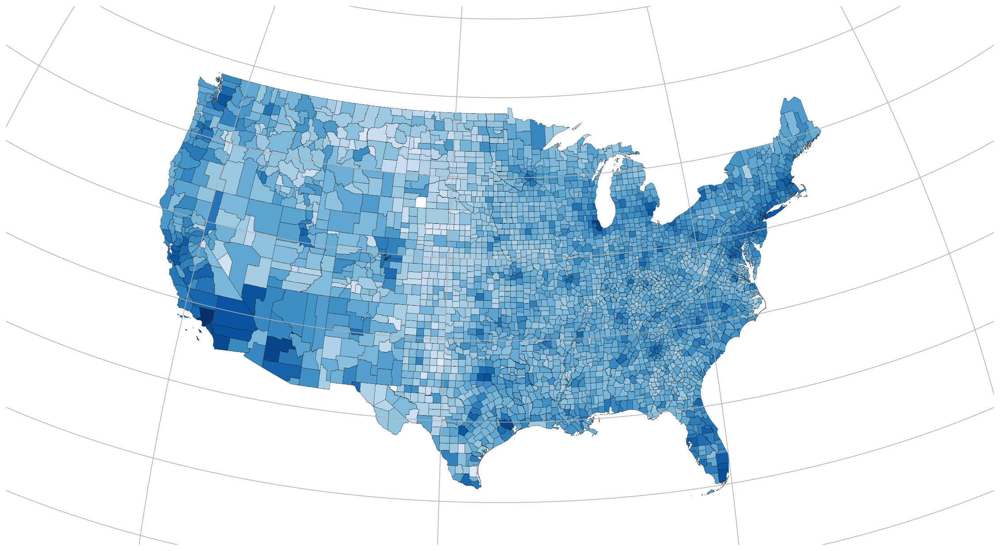

In [32]:
# Changing the projection to Orthographic

geoplot.choropleth(
    counties_choropleth,
    hue='LogPopulation',
    # scheme=scheme,
    cmap='Blues', # try Spectral_r, Spectral, or others from https://matplotlib.org/tutorials/colors/colormaps.html
    linewidth=0.2,
    edgecolor='black',
    projection=gcrs.Orthographic(),
    figsize=(20, 20)
).gridlines() # plot gridlines


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


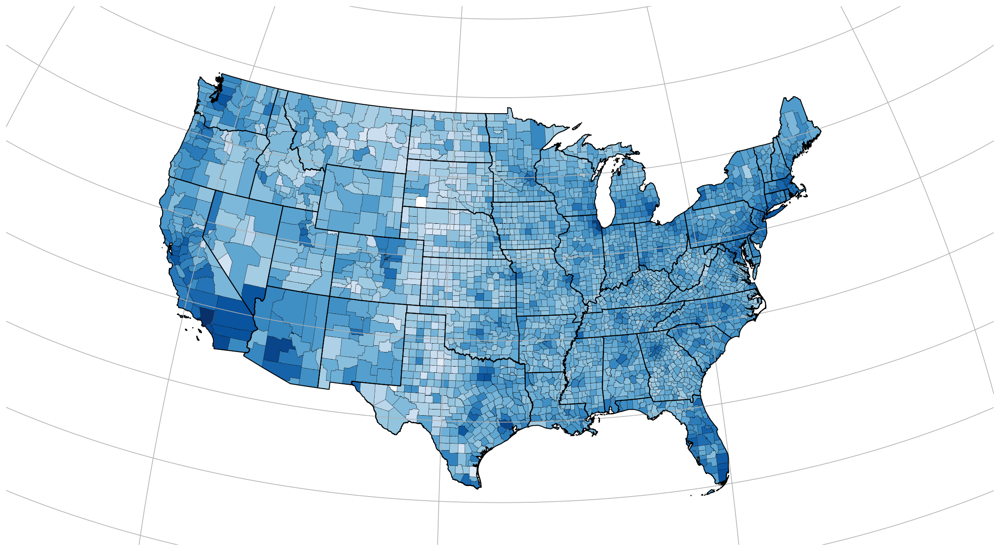

In [33]:
# Add state borders in the geoplot choropleth plot

ax = geoplot.polyplot(
    states_choropleth, 
    projection=gcrs.Orthographic(),
    figsize=(20, 20),
    linewidth = 1,
    zorder = 2
)

geoplot.choropleth(
    counties_choropleth,
    hue='LogPopulation',
    # scheme=scheme,
    cmap='Blues', # try Spectral_r, Spectral, or others from https://matplotlib.org/tutorials/colors/colormaps.html
    linewidth=0.2,
    edgecolor='black',
    projection=gcrs.Orthographic(),
    ax=ax,
    zorder = 0
).gridlines() # plot gridlines



## Unemployment Data

https://www.bls.gov/lau/
    
 * Labor force data by county, not seasonally adjusted, latest 14 months https://www.bls.gov/web/metro/laucntycur14.txt
 
 * Labor force data by county, 2017 annual averages https://www.bls.gov/lau/laucnty17.txt 

In [44]:
url = "https://www.bls.gov/web/metro/laucntycur14.txt"
udf = pd.read_csv(
    url,
    skiprows=6,  # skip the first six lines; 
    header=None,  # we will supply the headers ourselves
    skipfooter=6,  # the last six lines are notes; skip them
    engine='python',  # we need this to use the skipfooter option
    delimiter="|",  # use | as the column delimeter
    # skipinitialspace=True,  # ignore the space characters after the delimeter |
    thousands=",",  # specify that numbers use , for thousand separator
)

In [45]:
udf.head(5)

,0,1,2,3,4,5,6,7,8
0,CN0100100000000,1,1,"Autauga County, AL",Aug-20,25774,24282,1492,5.8
1,CN0100300000000,1,3,"Baldwin County, AL",Aug-20,98278,91978,6300,6.4
2,CN0100500000000,1,5,"Barbour County, AL",Aug-20,8631,7780,851,9.9
3,CN0100700000000,1,7,"Bibb County, AL",Aug-20,8628,7948,680,7.9
4,CN0100900000000,1,9,"Blount County, AL",Aug-20,24483,23337,1146,4.7


In [46]:
udf.dtypes

0     object
1      int64
2      int64
3     object
4     object
5      int64
6      int64
7      int64
8    float64
dtype: object

In [47]:
udf.columns = ["LAUS", "STATEFP", "COUNTYFP", "County_Name", "Period", 
               "Labor_Force", "Employed", "Unemployed", "Rate"]

In [48]:
udf.head(5)

,LAUS,STATEFP,COUNTYFP,County_Name,Period,Labor_Force,Employed,Unemployed,Rate
0,CN0100100000000,1,1,"Autauga County, AL",Aug-20,25774,24282,1492,5.8
1,CN0100300000000,1,3,"Baldwin County, AL",Aug-20,98278,91978,6300,6.4
2,CN0100500000000,1,5,"Barbour County, AL",Aug-20,8631,7780,851,9.9
3,CN0100700000000,1,7,"Bibb County, AL",Aug-20,8628,7948,680,7.9
4,CN0100900000000,1,9,"Blount County, AL",Aug-20,24483,23337,1146,4.7


In [49]:
udf.dtypes

LAUS            object
STATEFP          int64
COUNTYFP         int64
County_Name     object
Period          object
Labor_Force      int64
Employed         int64
Unemployed       int64
Rate           float64
dtype: object

In [50]:
# Convert STATEFP and COUNTYFP to strings and add leading zeros
# to allow for merging later on with the geodataframes
# Interestingly, the initial file contains the zeros, but Pandas recognizes
# the entries as numbers and converts to integers, so we are forced to convert back
udf.STATEFP = udf.STATEFP.apply(str).str.zfill(2)
udf.COUNTYFP = udf.COUNTYFP.apply(str).str.zfill(3)

In [51]:
udf.head(5)

,LAUS,STATEFP,COUNTYFP,County_Name,Period,Labor_Force,Employed,Unemployed,Rate
0,CN0100100000000,01,001,"Autauga County, AL",Aug-20,25774,24282,1492,5.8
1,CN0100300000000,01,003,"Baldwin County, AL",Aug-20,98278,91978,6300,6.4
2,CN0100500000000,01,005,"Barbour County, AL",Aug-20,8631,7780,851,9.9
3,CN0100700000000,01,007,"Bibb County, AL",Aug-20,8628,7948,680,7.9
4,CN0100900000000,01,009,"Blount County, AL",Aug-20,24483,23337,1146,4.7


In [52]:
# Using the thousands=","  option in read_csv allows Pandas to understand the 
# data type of these columns properly. If we do not use the option, the 
# code below can convert the values into recognizable numbers to be used by to_numeric
# 
# Need to replace the comma-separator in the numbers with an empty character
# to allow for proper conversion
#
# udf.Labor_Force = pd.to_numeric(udf.Labor_Force.str.replace(',',''),errors='coerce')
# udf.Employed = pd.to_numeric(udf.Employed.str.replace(',',''),errors='coerce')
# udf.Unemployed = pd.to_numeric(udf.Unemployed.str.replace(',',''),errors='coerce')
# udf.Rate = pd.to_numeric(udf.Rate,errors='coerce')

In [53]:
# We now want to convert the "Period" to datetime
# Let's take a look at the unique values
udf.Period.drop_duplicates()

0           Aug-20  
3219        Sep-20  
6438        Oct-20  
9657        Nov-20  
12876       Dec-20  
16095       Jan-21  
19314       Feb-21  
22533       Mar-21  
25752       Apr-21  
28971       May-21  
32190       Jun-21  
35409       Jul-21  
38628       Aug-21  
41847     Sep-21(p) 
Name: Period, dtype: object

In [54]:
# Converting "Period" to a proper date
# We will need to remove spaces 
# We will also need to remove the notes (p) and (y); we need to escape the parentheses
udf.Period = udf.Period.str.replace(' ','')
udf.Period = udf.Period.str.replace('\(p\)','')
udf.Period = udf.Period.str.replace('\(y\)','')
udf.Period.drop_duplicates()

0        Aug-20
3219     Sep-20
6438     Oct-20
9657     Nov-20
12876    Dec-20
16095    Jan-21
19314    Feb-21
22533    Mar-21
25752    Apr-21
28971    May-21
32190    Jun-21
35409    Jul-21
38628    Aug-21
41847    Sep-21
Name: Period, dtype: object

In [55]:
udf.Period = pd.to_datetime(udf.Period, format='%b-%y')

In [56]:
udf.head(5)

,LAUS,STATEFP,COUNTYFP,County_Name,Period,Labor_Force,Employed,Unemployed,Rate
0,CN0100100000000,01,001,"Autauga County, AL",2020-08-01,25774,24282,1492,5.8
1,CN0100300000000,01,003,"Baldwin County, AL",2020-08-01,98278,91978,6300,6.4
2,CN0100500000000,01,005,"Barbour County, AL",2020-08-01,8631,7780,851,9.9
3,CN0100700000000,01,007,"Bibb County, AL",2020-08-01,8628,7948,680,7.9
4,CN0100900000000,01,009,"Blount County, AL",2020-08-01,24483,23337,1146,4.7


In [57]:
udf.dtypes

LAUS                   object
STATEFP                object
COUNTYFP               object
County_Name            object
Period         datetime64[ns]
Labor_Force             int64
Employed                int64
Unemployed              int64
Rate                  float64
dtype: object

In [58]:
unemployment_average = udf.pivot_table(
    index = ['STATEFP','COUNTYFP', 'County_Name'],
    values = ['Rate','Labor_Force'],
    aggfunc = 'mean'
)

unemployment_average = unemployment_average.reset_index()
unemployment_average.head(5)

,STATEFP,COUNTYFP,County_Name,Labor_Force,Rate
0,01,001,"Autauga County, AL",25674.5,3.285714
1,01,003,"Baldwin County, AL",98069.0,3.450000
2,01,005,"Barbour County, AL",8075.0,6.542857
3,01,007,"Bibb County, AL",8606.5,4.150000
4,01,009,"Blount County, AL",24825.0,2.607143


In [59]:
unemployment_average.Rate.describe()

count    3219.000000
mean        5.323450
std         2.043533
min         1.178571
25%         3.939286
50%         5.021429
75%         6.300000
max        18.321429
Name: Rate, dtype: float64

In [60]:
# County with the highest unemployment rate
unemployment_average [ unemployment_average.Rate == unemployment_average.Rate.max() ]

,STATEFP,COUNTYFP,County_Name,Labor_Force,Rate
198,06,025,"Imperial County, CA",66786.642857,18.321429


In [61]:
# County with the lowest unemployment rate
unemployment_average [ unemployment_average.Rate == unemployment_average.Rate.min() ]

,STATEFP,COUNTYFP,County_Name,Labor_Force,Rate
1744,31,183,"Wheeler County, NE",540.571429,1.178571


In [62]:
# County with the median unemployment rate
unemployment_average [ unemployment_average.Rate == unemployment_average.Rate.median() ]

,STATEFP,COUNTYFP,County_Name,Labor_Force,Rate
468,13,165,"Jenkins County, GA",3238.928571,5.021429
1636,30,079,"Prairie County, MT",472.714286,5.021429
1951,37,125,"Moore County, NC",41300.857143,5.021429
2458,47,063,"Hamblen County, TN",28215.071429,5.021429


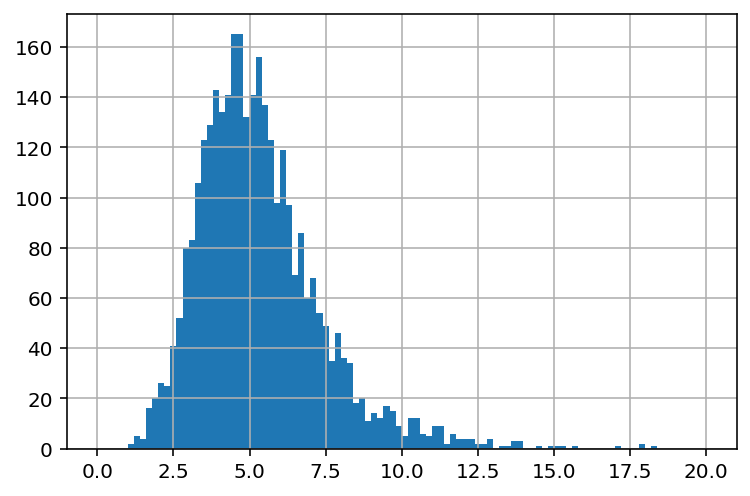

In [63]:
unemployment_average.Rate.hist(bins=100,range=(0,20))

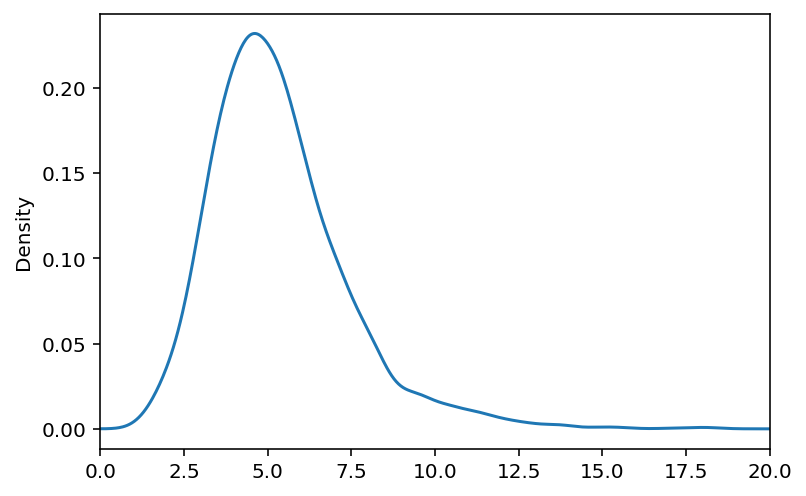

In [64]:
unemployment_average.Rate.plot.kde(xlim=(0,20))

Text(0.5, 0, 'Unemployment Rate (%)')

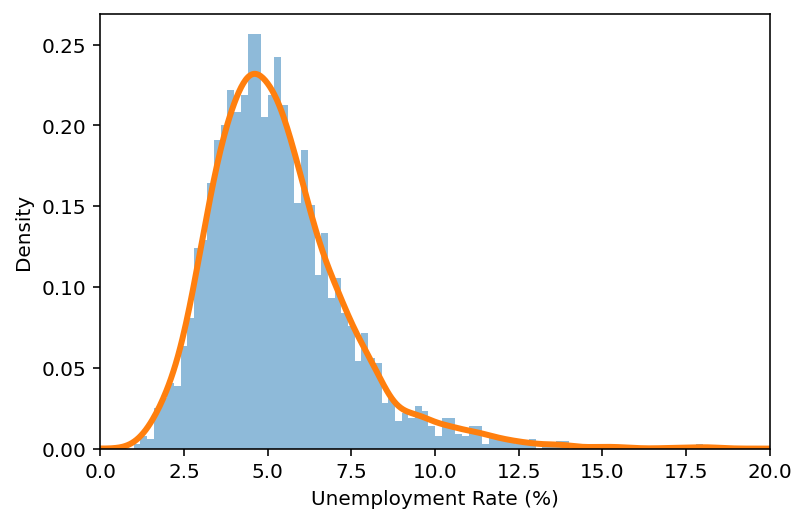

In [65]:
ax = unemployment_average.Rate.hist(bins=100,range=(0,20), density=True, alpha=0.5)
ax = unemployment_average.Rate.plot.kde(xlim=(0,20), ax=ax, linewidth=3)
ax.set_xlabel("Unemployment Rate (%)")

In [66]:
# Merge the GeoDataFrame df_counties with the unemployment data
# Note that this will drop the rates for counties in Alaska and Hawaii
# as this is an inner join, and we have dropped from df_counties Alaska and Hawaii
unemployment_choropleth = pd.merge(df_counties, unemployment_average, on=['STATEFP', 'COUNTYFP'])

In [67]:
# Rank the unemployment rates
unemployment_choropleth['rate_percentile'] = unemployment_choropleth['Rate'].rank(pct=True)

In [68]:
unemployment_choropleth.head(5)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,County_Name,Labor_Force,Rate,rate_percentile
0,01,005,00161528,0500000US01005,01005,Barbour,06,2292144656,50538698,"POLYGON ((-85.74803 31.61918, -85.74544 31.618...","Barbour County, AL",8075.000000,6.542857,0.804537
1,01,023,00161537,0500000US01023,01023,Choctaw,06,2365869837,19144469,"POLYGON ((-88.47323 31.89386, -88.46888 31.930...","Choctaw County, AL",4652.928571,4.728571,0.452542
2,01,035,00161543,0500000US01035,01035,Conecuh,06,2201948618,6643480,"POLYGON ((-87.42720 31.26436, -87.42551 31.268...","Conecuh County, AL",4460.571429,5.507143,0.633848
3,01,051,00161551,0500000US01051,01051,Elmore,06,1601762124,99965171,"POLYGON ((-86.41333 32.75059, -86.37115 32.750...","Elmore County, AL",36400.714286,3.228571,0.117921
4,01,065,00161558,0500000US01065,01065,Hale,06,1667907107,32423356,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...","Hale County, AL",5934.785714,6.771429,0.831885


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


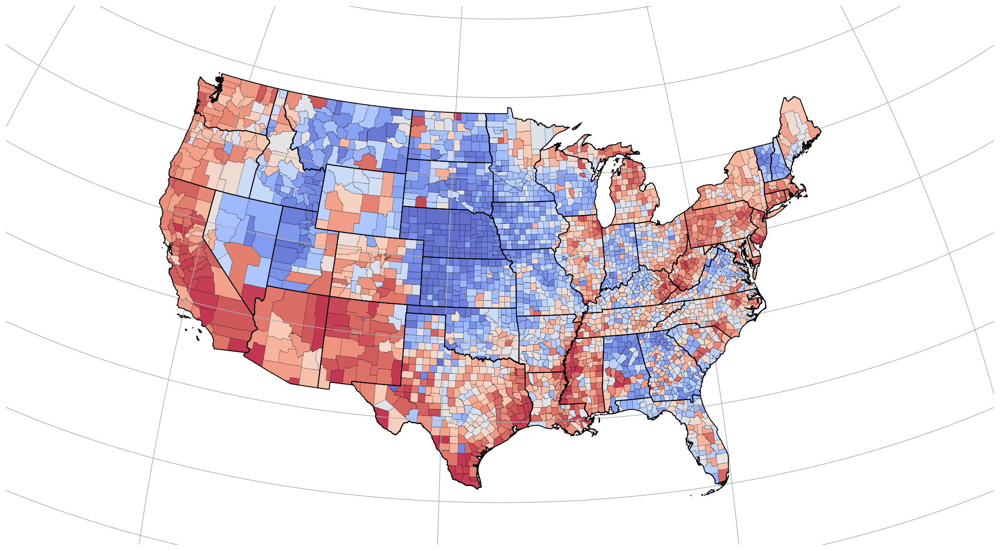

In [69]:
# Compare with https://www.bls.gov/web/metro/twmcort.pdf

ax = geoplot.polyplot(
    df_states, 
    projection=gcrs.Orthographic(),
    figsize=(20, 20),
    linewidth = 1,
    zorder = 2
)

scheme = mc.Quantiles(unemployment_choropleth['Rate'],k=100)

geoplot.choropleth(
    unemployment_choropleth,
    hue='Rate',
    scheme=scheme,
    cmap='coolwarm', # try RdYlBu_r, RdBu_r, Spectral_r, Spectral, or others from https://matplotlib.org/tutorials/colors/colormaps.html
    linewidth=0.2,
    edgecolor='black',
    projection=gcrs.Orthographic(),
    ax=ax,
    alpha=0.8,
    zorder = 0
).gridlines() # plot gridlines


### Extra: Saving quantiles as a separate column

In [70]:
num_quantiles = 10

In [71]:
quantiles = pd.qcut(unemployment_choropleth.Rate, num_quantiles)

In [72]:
# Let's see the ranges for the quantiles
quantiles.drop_duplicates().sort_values()

7     (1.1780000000000002, 3.098]
3                  (3.098, 3.667]
44                 (3.667, 4.136]
10                 (4.136, 4.529]
1                  (4.529, 4.943]
9                  (4.943, 5.373]
2                  (5.373, 5.871]
37                 (5.871, 6.504]
0                  (6.504, 7.479]
21                (7.479, 18.321]
Name: Rate, dtype: category
Categories (10, interval[float64]): [(1.1780000000000002, 3.098] < (3.098, 3.667] < (3.667, 4.136] <
                                     (4.136, 4.529] ... (5.373, 5.871] < (5.871, 6.504] <
                                     (6.504, 7.479] < (7.479, 18.321]]

In [73]:
# We use the labels=Fase to get a number (0,1,2,3...) instead of the range labels 
unemployment_choropleth["qRate"] = pd.qcut(unemployment_choropleth.Rate, num_quantiles, labels=False)
unemployment_choropleth["Rate_range"] = pd.qcut(unemployment_choropleth.Rate, num_quantiles)

In [74]:
unemployment_choropleth.head(5)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,County_Name,Labor_Force,Rate,rate_percentile,qRate,Rate_range
0,01,005,00161528,0500000US01005,01005,Barbour,06,2292144656,50538698,"POLYGON ((-85.74803 31.61918, -85.74544 31.618...","Barbour County, AL",8075.000000,6.542857,0.804537,8,"(6.504, 7.479]"
1,01,023,00161537,0500000US01023,01023,Choctaw,06,2365869837,19144469,"POLYGON ((-88.47323 31.89386, -88.46888 31.930...","Choctaw County, AL",4652.928571,4.728571,0.452542,4,"(4.529, 4.943]"
2,01,035,00161543,0500000US01035,01035,Conecuh,06,2201948618,6643480,"POLYGON ((-87.42720 31.26436, -87.42551 31.268...","Conecuh County, AL",4460.571429,5.507143,0.633848,6,"(5.373, 5.871]"
3,01,051,00161551,0500000US01051,01051,Elmore,06,1601762124,99965171,"POLYGON ((-86.41333 32.75059, -86.37115 32.750...","Elmore County, AL",36400.714286,3.228571,0.117921,1,"(3.098, 3.667]"
4,01,065,00161558,0500000US01065,01065,Hale,06,1667907107,32423356,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...","Hale County, AL",5934.785714,6.771429,0.831885,8,"(6.504, 7.479]"


### Mitigating map visualization bias: Area vs Population

In the example above, where we visualize unemployment rates per county, we introduce a bias: Areas with large area get more prominently displayed. We can try to mitigate this bias, by using cartograms, which scale each area based on a factor that we desire. 

* **County weight proportional to county area**: Scaling factor `constant` (the default).
* **County weight equal across all counties**: Scaling factor proportional to `1/area`
* **County weight proportional to county population**: Scaling factor proportional to `population/area`

So, for example, if we want each country to have an area proportional to its **population** instead of its **area**, we may want to use Density (population divided by area)

In [75]:
# Density = Population / Area
unemployment_choropleth["Density"] = unemployment_choropleth.Labor_Force / unemployment_choropleth.ALAND

In [76]:
# Normalize density to have a minimum value of 1... 
# Alternatively, we can do it to have a max value of 1 by dividing with max
unemployment_choropleth["Density"] = unemployment_choropleth.Density / unemployment_choropleth.Density.min()

In [77]:
# Take the log, as densities are roughly log-normally distributed (as is population)
# We also normalize it by dividing with the max value (to make it 0...1 )
# Finally we add a multiplicative factor of mult_factor
mult_factor = 1.5
unemployment_choropleth["LogDensity"] = mult_factor * np.log10(unemployment_choropleth.Density)/np.log10(unemployment_choropleth.Density.max())

In [78]:
# Statistics on LogDensity values
unemployment_choropleth.LogDensity.describe()

count    3108.000000
mean        0.613045
std         0.207936
min         0.000000
25%         0.492301
50%         0.606655
75%         0.728583
max         1.500000
Name: LogDensity, dtype: float64

Text(0.5, 0, 'County Population Density (log-scale, normalized)')

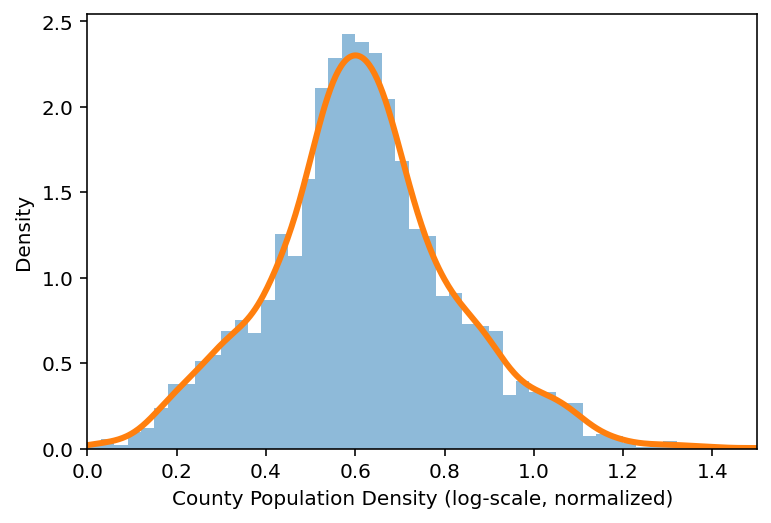

In [79]:
ax = unemployment_choropleth.LogDensity.hist(bins=50,range=(0,mult_factor), density=True, alpha=0.5)
ax = unemployment_choropleth.LogDensity.plot.kde(xlim=(0,mult_factor), ax=ax, linewidth=3)
ax.set_xlabel("County Population Density (log-scale, normalized)")

In [80]:
unemployment_choropleth[ unemployment_choropleth.Density == unemployment_choropleth.Density.max()]

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,County_Name,Labor_Force,Rate,rate_percentile,qRate,Rate_range,Density,LogDensity
3000,36,061,00974129,0500000US36061,36061,New York,06,58681329,28550878,"MULTIPOLYGON (((-73.99950 40.70033, -73.99750 ...","New York County, NY",871757.0,8.914286,0.962999,9,"(7.479, 18.321]",332468.09566,1.5


In [81]:
density_min = unemployment_choropleth.LogDensity.min()
density_max = unemployment_choropleth.LogDensity.max()

In [82]:
density_min

0.0

In [83]:
density_max

1.5

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


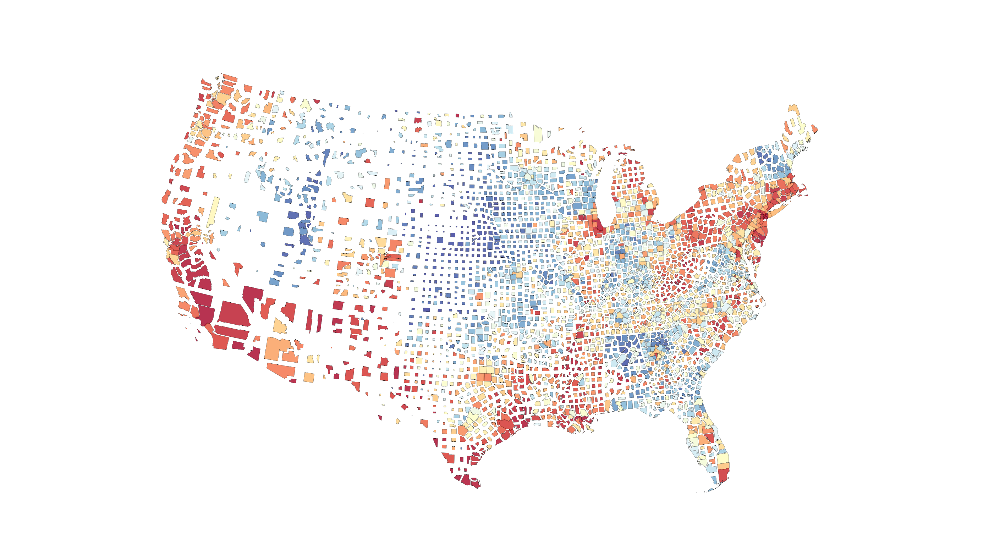

In [84]:
geoplot.cartogram(
    unemployment_choropleth,
    scale='LogDensity',
    limits=(density_min,density_max),
    projection=gcrs.Orthographic(),
    scheme=mc.Quantiles(unemployment_choropleth['Rate'],k=100),
    hue='Rate',
    cmap='RdYlBu_r',
    linewidth=0.2,
    edgecolor='black',
    alpha=0.8,
    figsize=(25, 25))

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


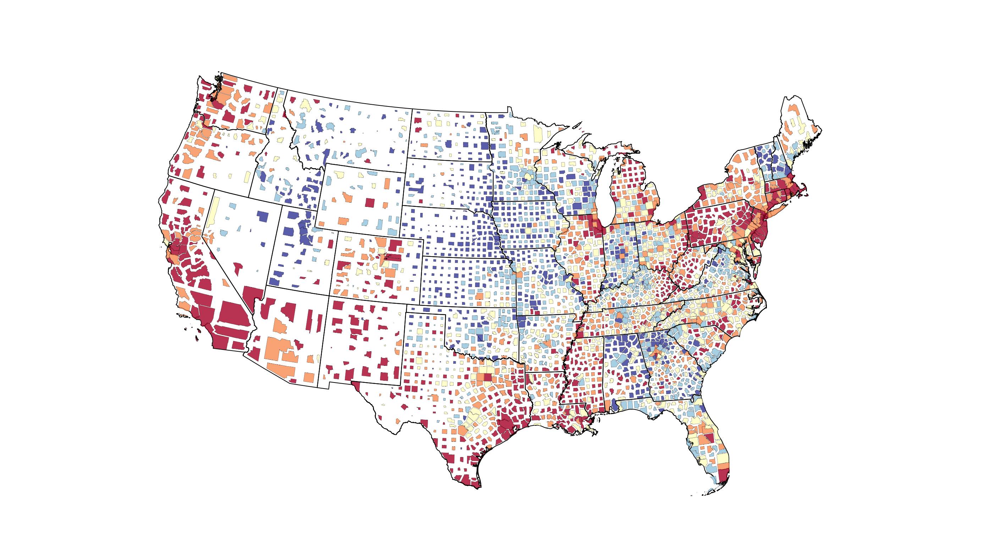

In [85]:
# Instead of doing manipulations of the density column on the dataframe,
# we can instead write a scaling function
def log_scale(minval, maxval):
    def scalar(val):
        max_scaling = mult_factor
        min_scaling = 0.0
        normed_log = np.log10(val) - np.log10(minval)
        max_log = np.log10(maxval) - np.log10(minval)
        factor = (max_scaling-min_scaling) * normed_log/max_log + min_scaling
        return factor
    return scalar

ax = geoplot.polyplot(
    df_states, 
    projection=gcrs.Orthographic(),
    edgecolor='black', 
    facecolor='none',
    linewidth = 1,
    figsize=(25, 25)
)

geoplot.cartogram(
    unemployment_choropleth,
    scale='Density',
    scale_func=log_scale,
    projection=gcrs.Orthographic(),
    scheme='quantiles',
    hue='Rate',
    cmap='RdYlBu_r',
    linewidth=0.2,
    edgecolor='black',
    alpha=0.8,    
    ax = ax)